<a href="https://colab.research.google.com/github/FangmingXie/collab-workshop-st/blob/main/trash/solution1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 1: How to make a scatter plot, and how to iteratively make a better one.

Dataset:
Vizgen Data Release V1.0. May 2021

In [ ]:
## Install and import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# set plot style
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set_context('talk')

In [ ]:
# functions (the teacher wrote for you to use later)
def rot2d(x, y, theta, unit='degree'):
    """ rotate data points defined by `x` and `y` by `theta` degree
    """
    a = np.vstack([x,y]).T
    if unit == 'degree':
        theta = theta*np.pi/180 # convert to radian

    R = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
    ar = a.dot(R.T)
    return ar[:,0], ar[:,1]

### Iteration 1: make a minimalist scatter plot
Pretending each dot is a cell, so this plot shows their locations in space!

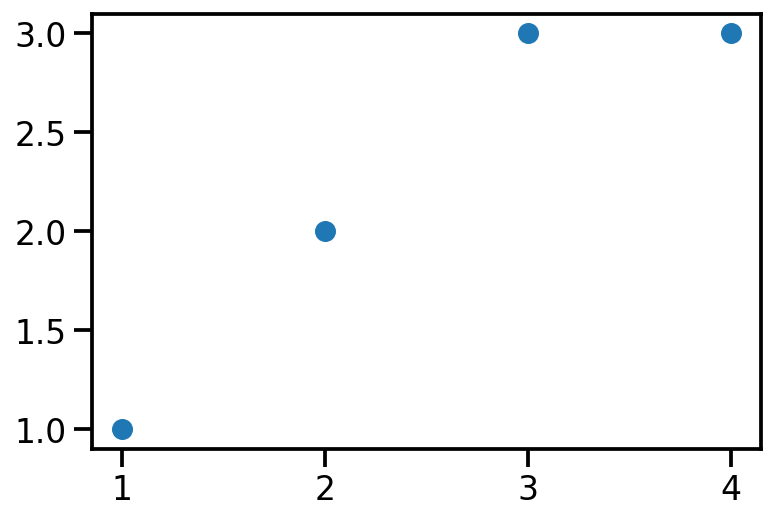

In [ ]:
x = [1,2,3,4]
y = [1,2,3,3]

plt.scatter(x, y)

### Iteration 2: add a color for each dot
The colors could represent the gene expression levels for each cell -- now it's spatial transcriptomics!

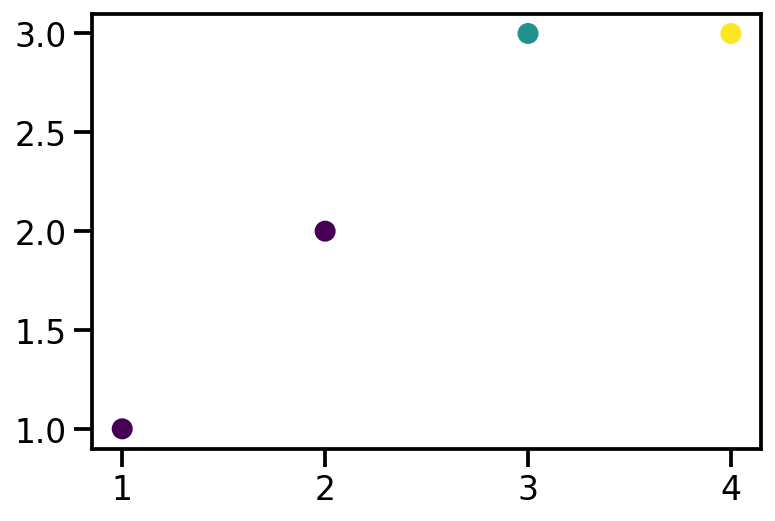

In [ ]:
x = [1,2,3,4]
y = [1,2,3,3]
gene = [0, 0, 1, 2]

plt.scatter(x, y, c=gene)

### Iteration 3: add a color bar and tune figure size
Display of colors should always be accompanied by a colorbar.

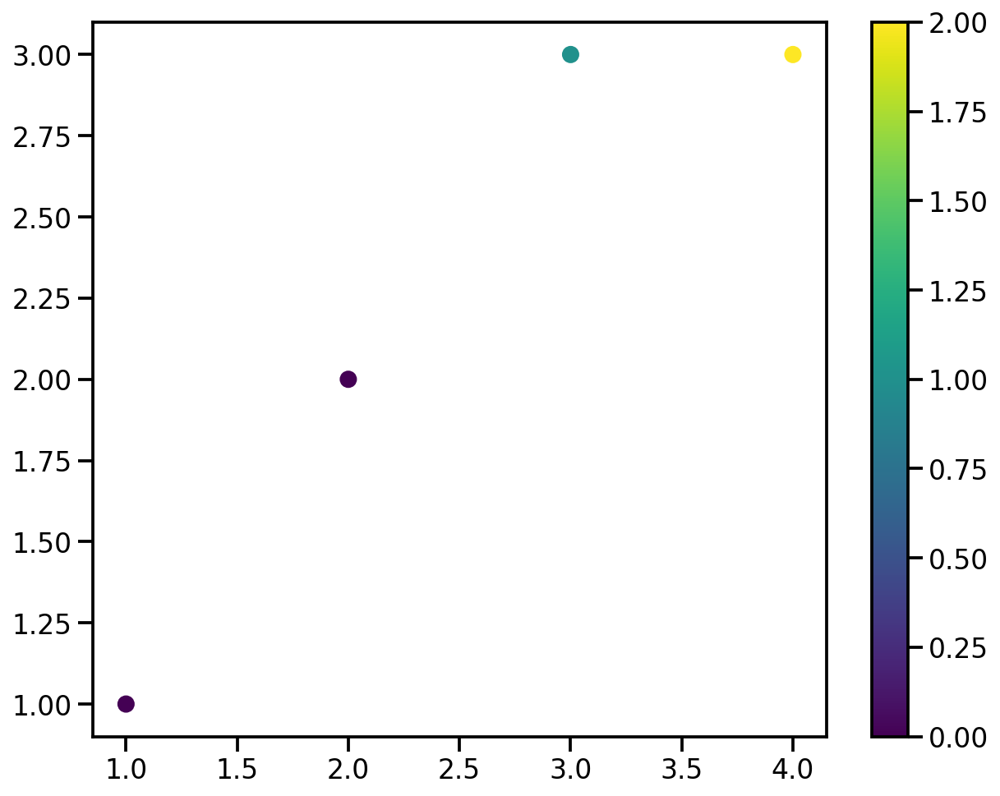

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=gene)
fig.colorbar(g)

### Iteration 4: Make the plot using REAL data 

### Load data
*The data is adapted from the original data source: Vizgen Data Release V1.0. May 2021*

### Making the plot
- how to get the information we need from the data table?
- Using one gene as an example: `Slc17a7`

*The data is adapted from the original data source: Vizgen Data Release V1.0. May 2021*

In [ ]:
# this might take ~5 seconds
f = "https://raw.githubusercontent.com/FangmingXie/collab-workshop-st/main/data/vizgen_mouse_brain_S2R2.csv.gz"
data = pd.read_csv(f, index_col=0)
data

,x,y,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
0,594.918018,5628.150243,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,0.0
1,576.450018,5762.286246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,2.0,0.0,1.0,4.0,0.0,3.0,0.0,0.0,0.0
2,564.462017,5721.624245,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,538.164017,5605.475642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,610.362018,5652.936244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,9235.566329,3349.566107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
84168,9225.738329,3261.654105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,3.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0
84169,9230.976329,3287.358106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0
84170,9236.754329,3364.956108,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


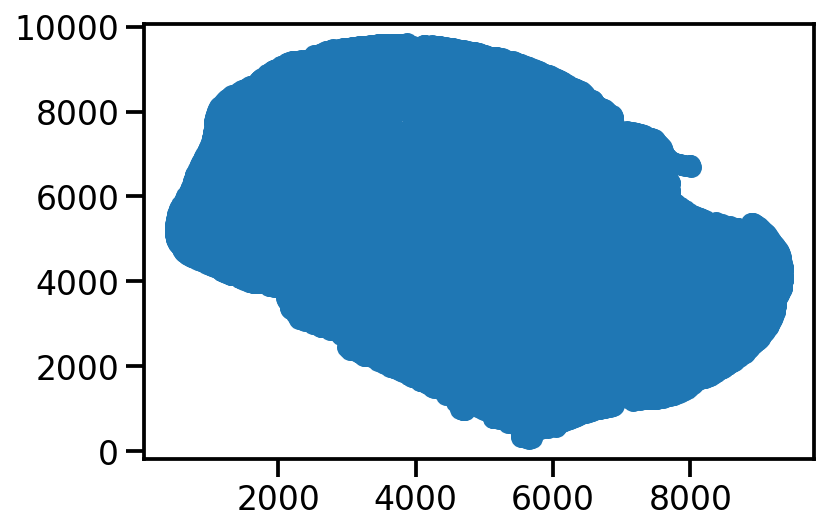

In [ ]:
x = data['x'] 
y = data['y'] 

gene = 'Slc17a7'
gexp = data['Slc17a7'] 

plt.scatter(x, y)

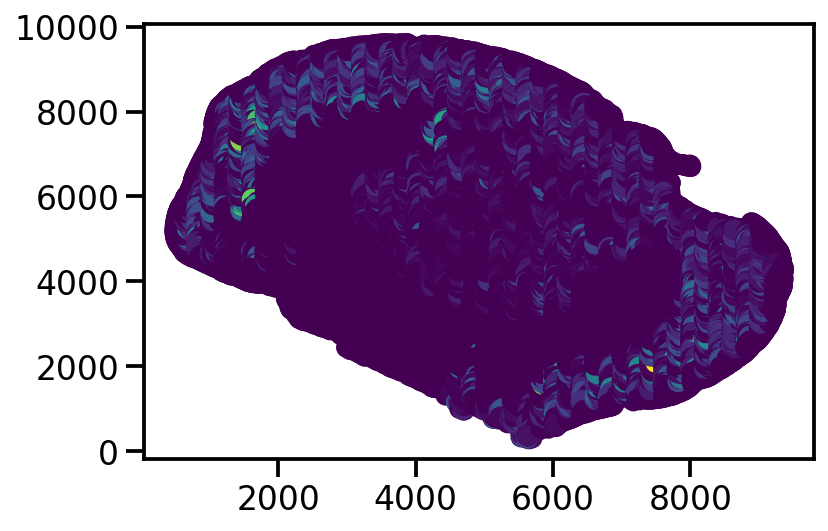

In [ ]:
plt.scatter(x, y, c=gexp)

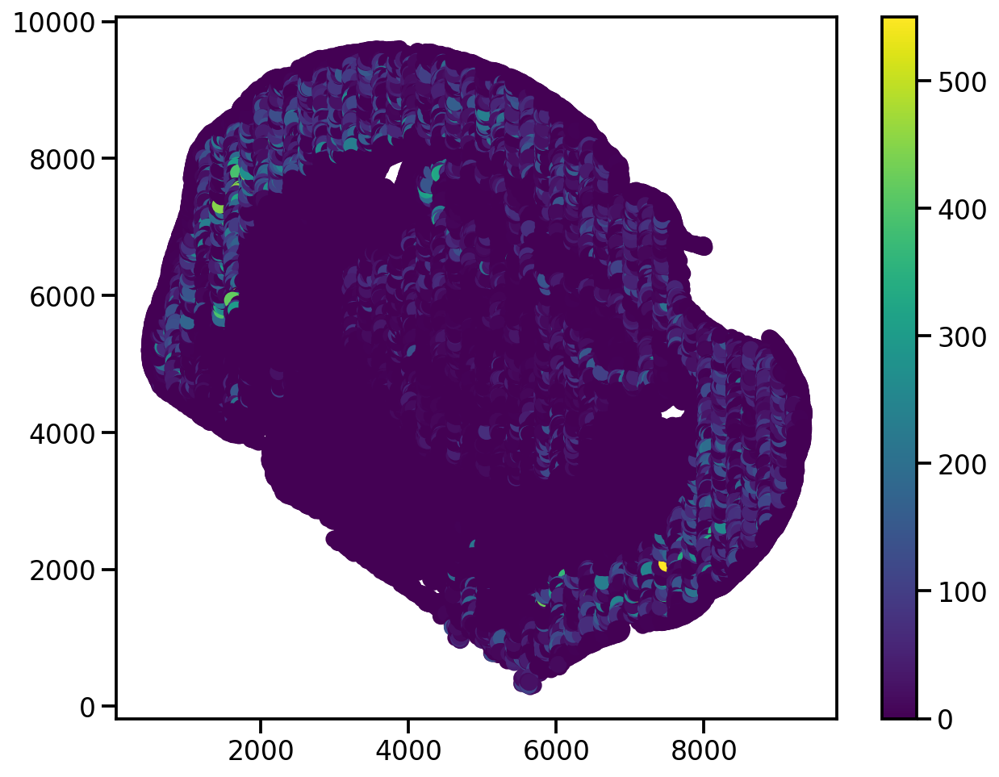

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=gexp)
fig.colorbar(g)

### Pause and Ponder -- why does the real data doesn't look good?
- too many dots? too crowded? figure not big enough?
- range of gene expression?

### Iteration 5: Shrinking the point sizes alleviates the crowding issue

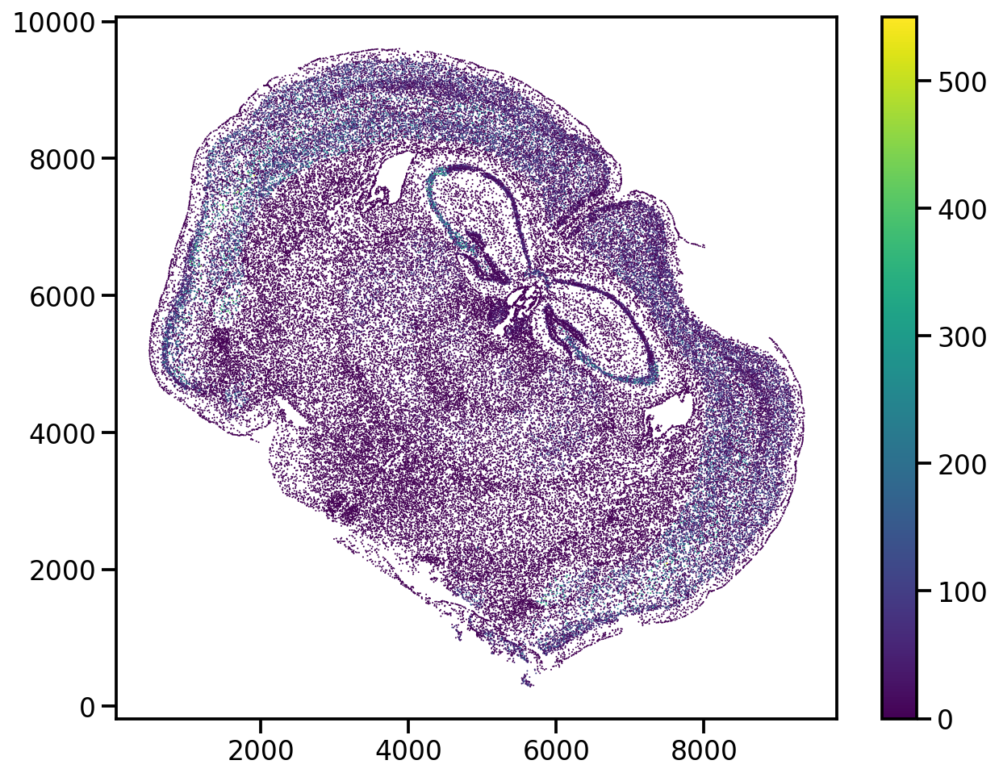

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=gexp, s=1, edgecolor='none')
fig.colorbar(g)

### Iteration 6: Clipping the outliers makes expression differences visible.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


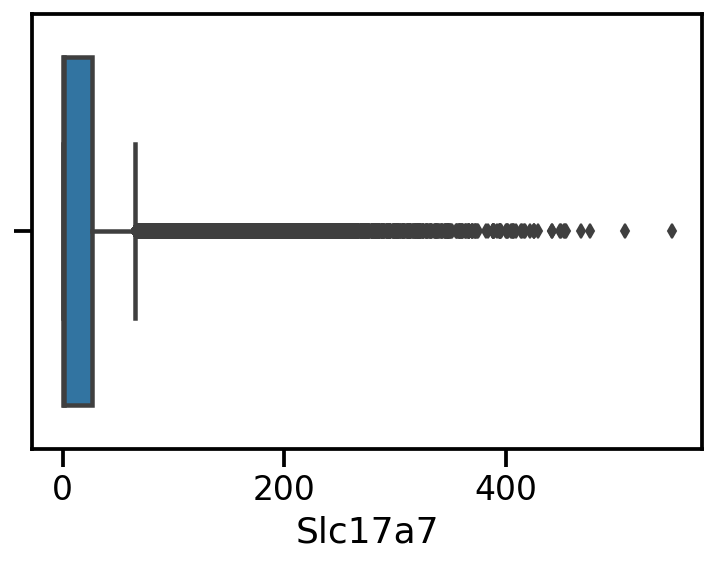

In [ ]:
# check the range of expression values -- mostly around 0-100
# with quite some outliers skewing the how distribution
sns.boxplot(gexp)

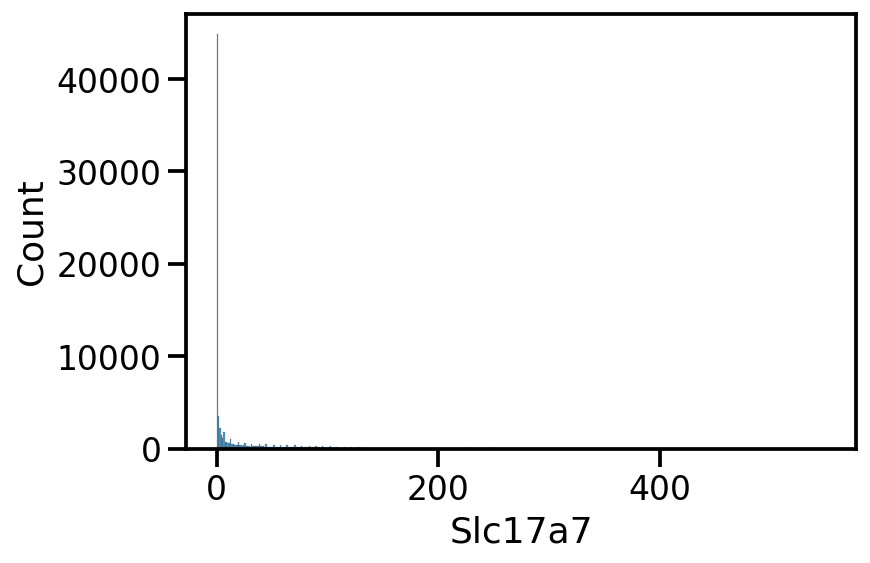

In [ ]:
# one more way of showing the same thing -- a "long-tailed" distribution
sns.histplot(gexp)

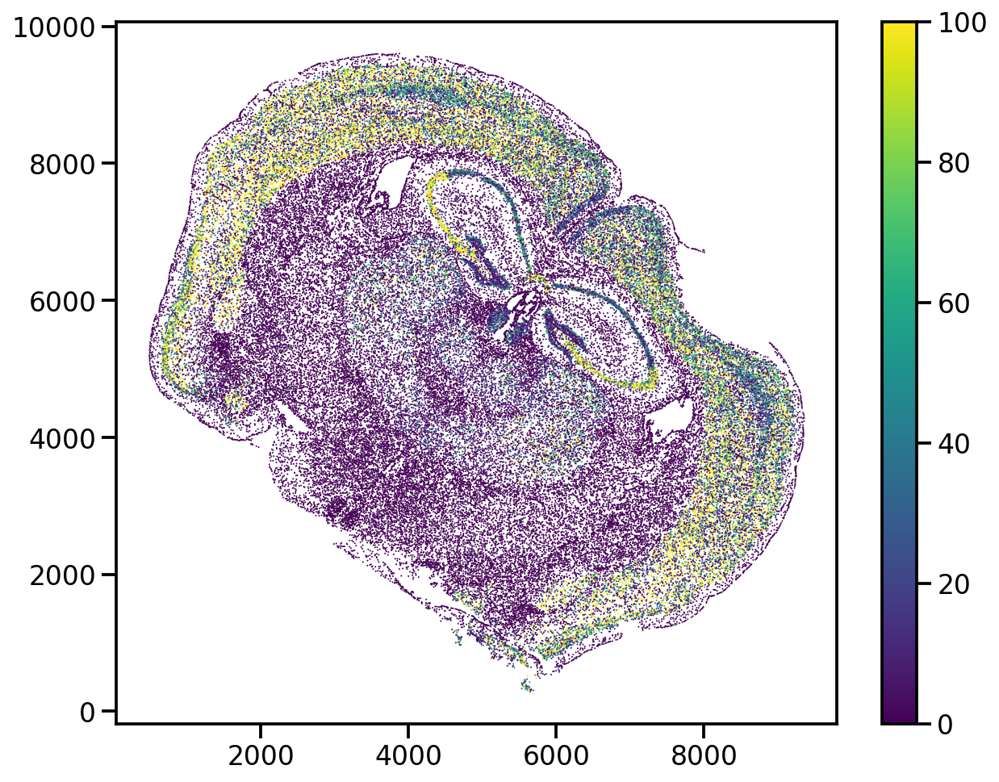

In [ ]:
# set the upper bound of the colormap to be 100
# anything >100 will show the same color as 100

fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=gexp, s=1, edgecolor='none', vmax=100)
fig.colorbar(g)

### Iteration 7: Automate the maximum thresholding 
- set the maximum at the 95 percentile of the gene expression (clip 5% of the outliers)

131.0


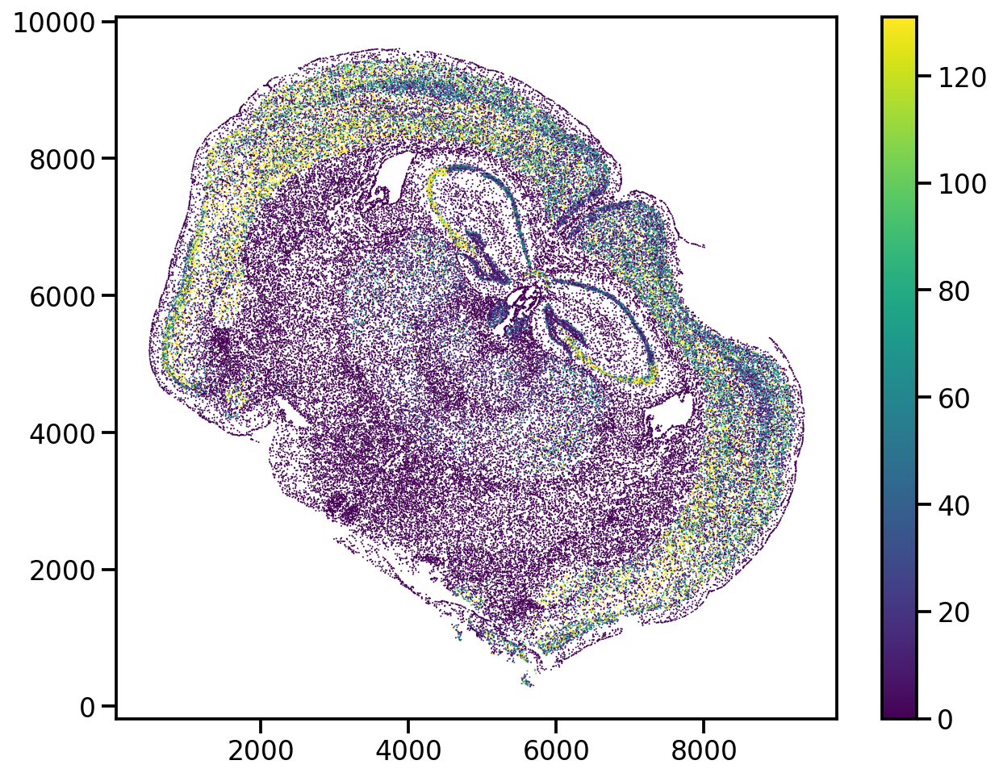

In [ ]:
setvmax = np.percentile(gexp, 95)
print(setvmax)

fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=gexp, s=1, edgecolor='none', vmax=setvmax)
fig.colorbar(g)

### Iteration 8: Clipping the outlier is only one solution, the other is to normalize the data
- $\log_{10}(x+1)$ normalization is common for gene expression analysis. Why?

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


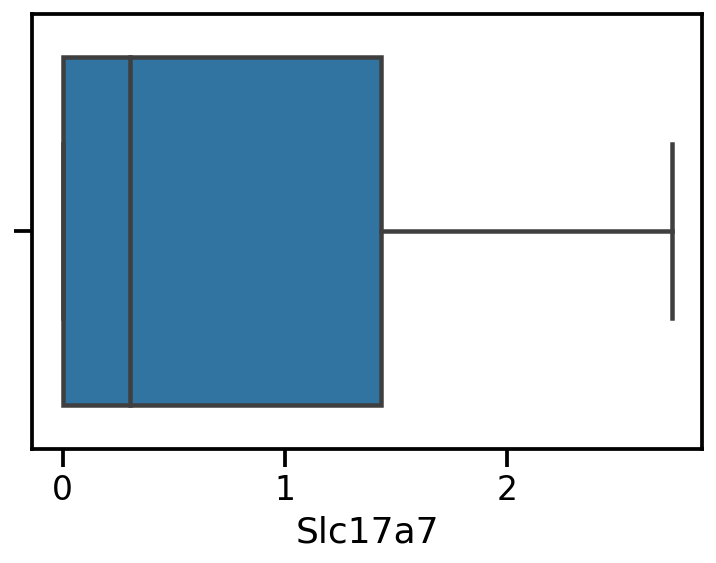

In [ ]:
sns.boxplot(np.log10(1+gexp))

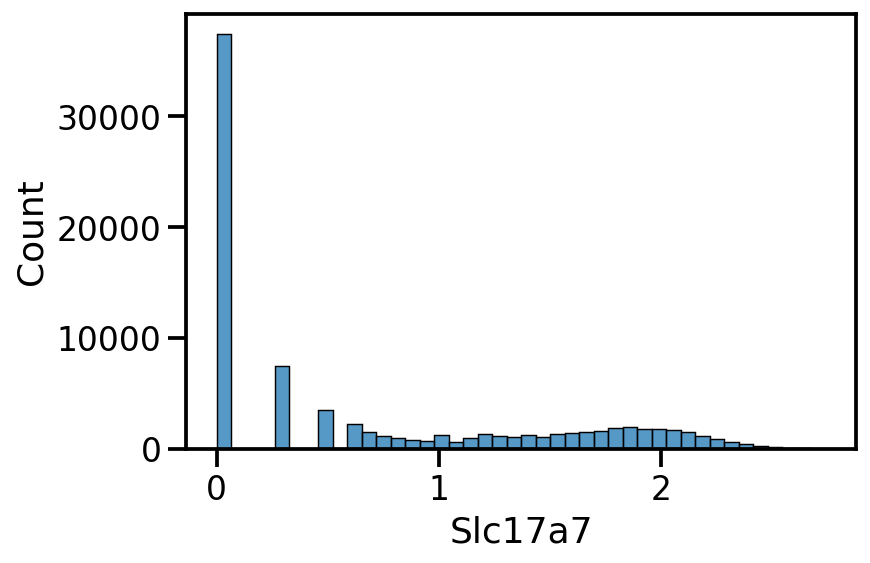

In [ ]:
sns.histplot(np.log10(1+gexp))

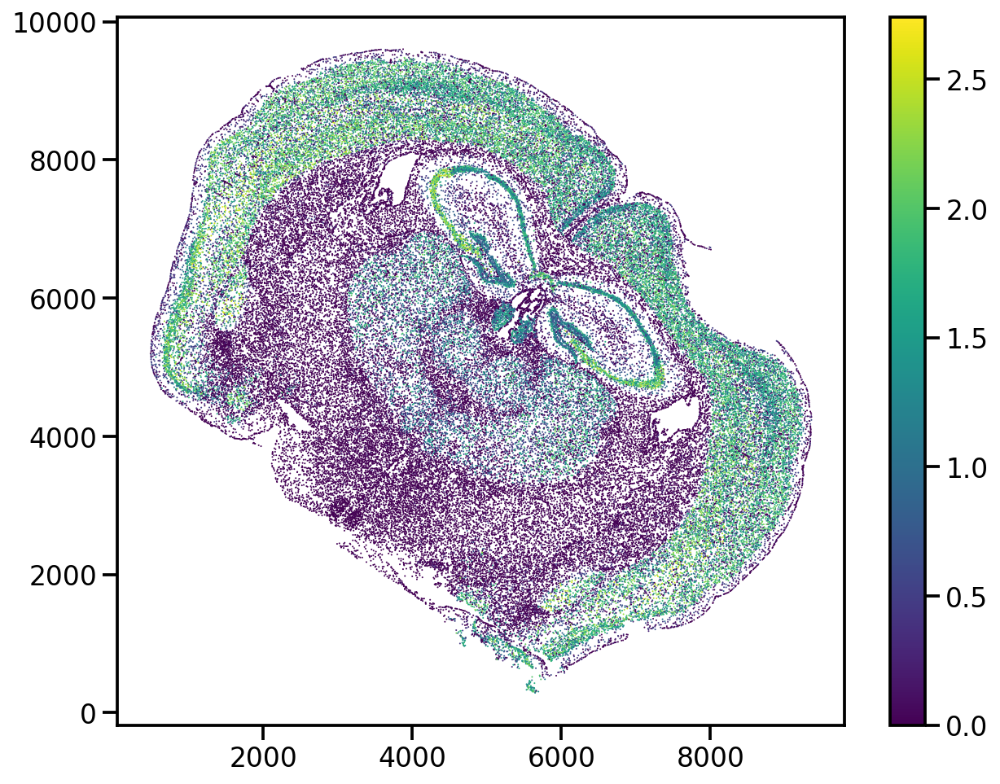

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(x, y, c=np.log10(gexp+1), s=1, edgecolor='none')
fig.colorbar(g)

### Iteration 9: Rotate the x, y coordinates so the sample looks level 
- We will use the function `rot2d` defined at the upfront to transform `x` and `y` into `xr` and `yr` 
- Try different angles and settle on one

In [ ]:
x = data['x'] 
y = data['y'] 

gene = 'Slc17a7'
gexp = data['Slc17a7'] 

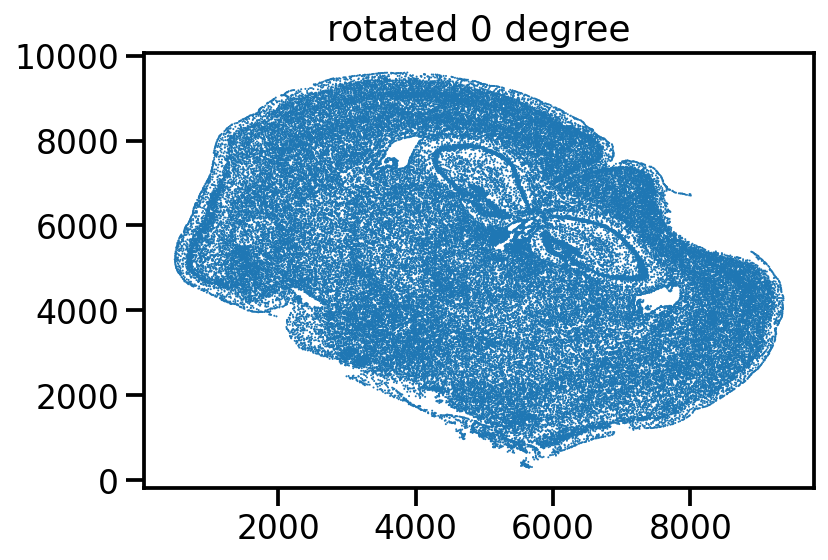

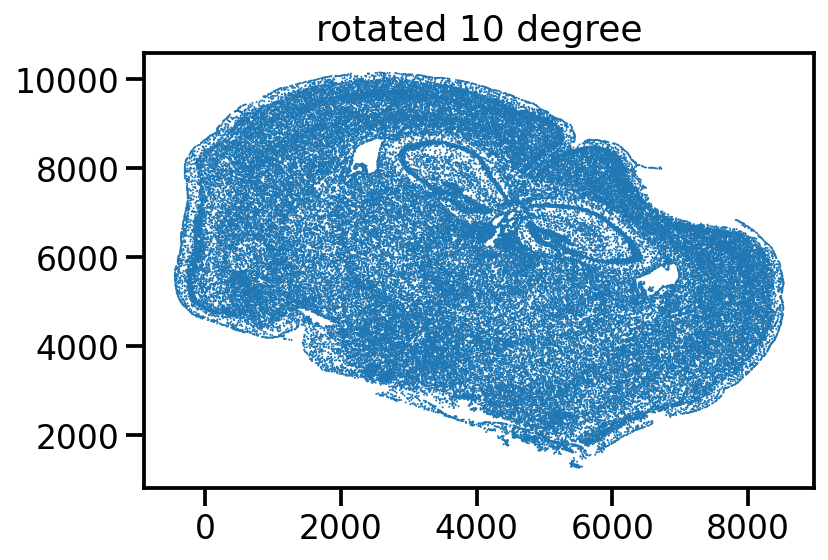

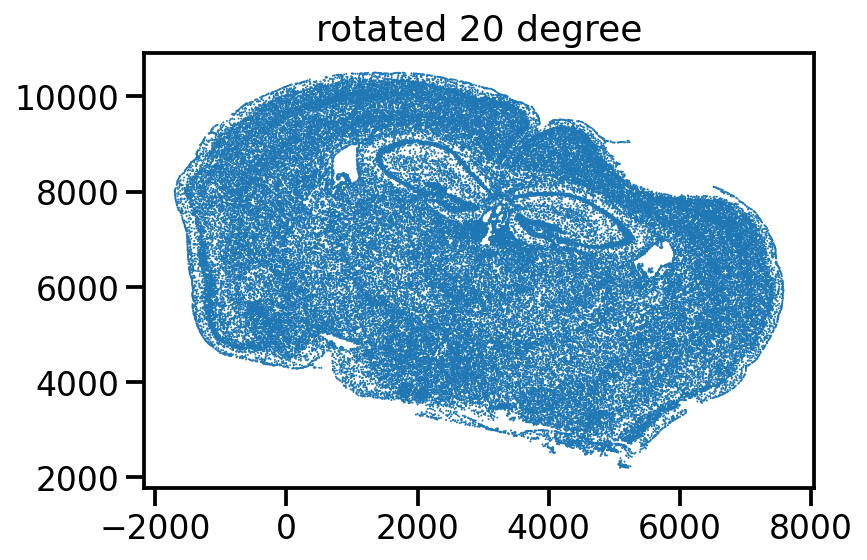

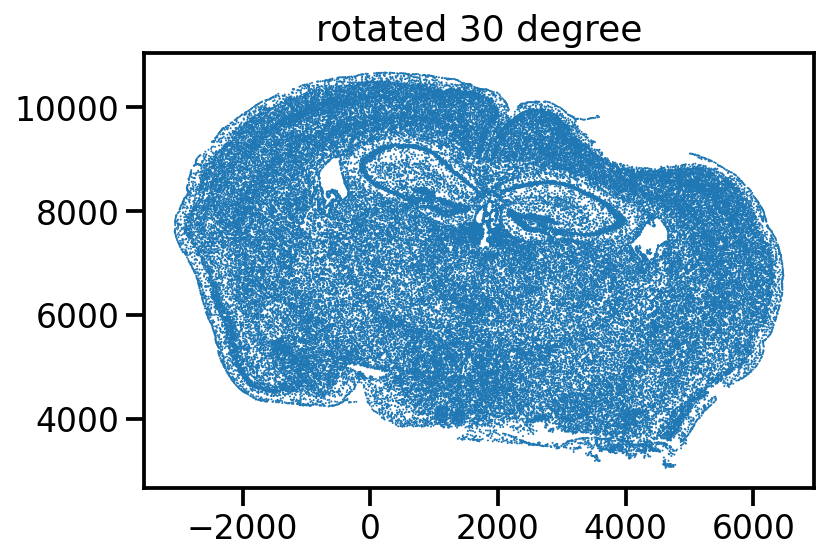

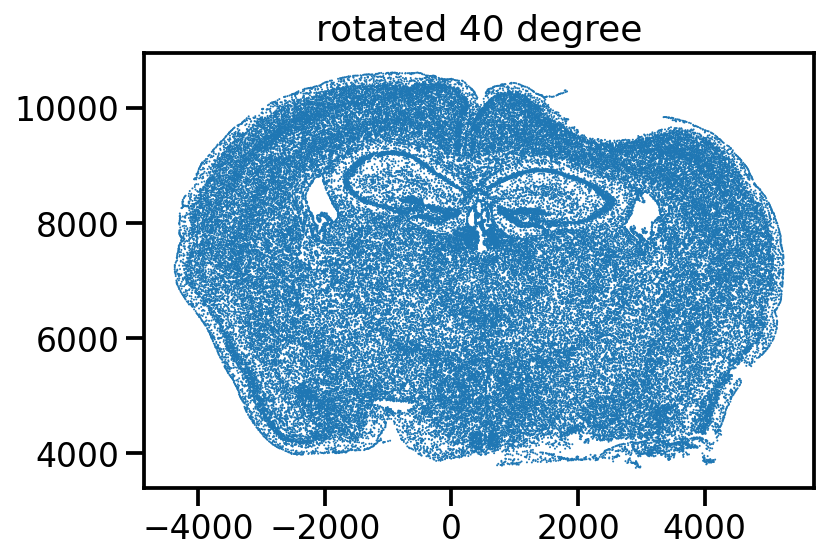

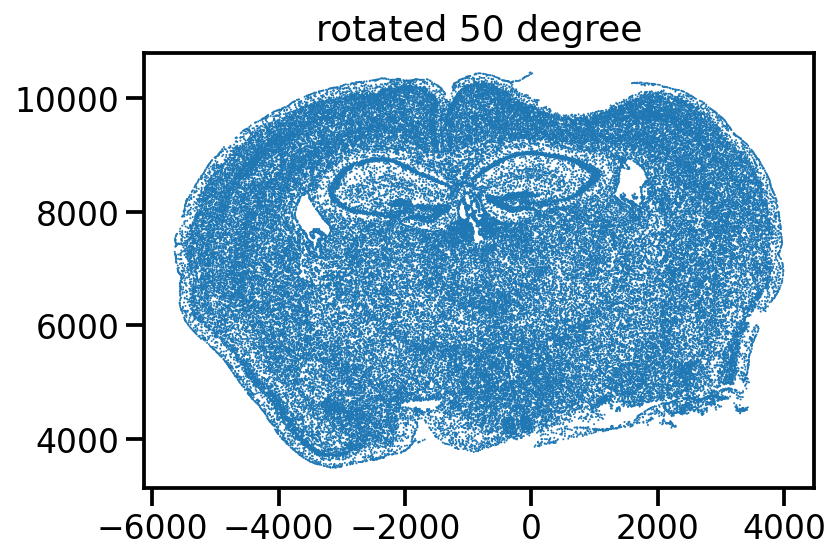

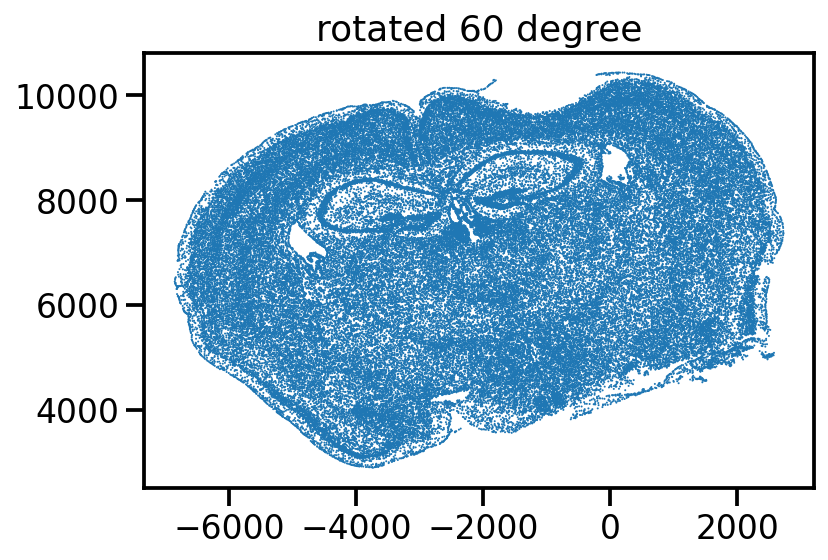

In [ ]:
for theta in [0, 10, 20, 30, 40, 50, 60]:
  xr, yr = rot2d(x, y, theta)

  fig, ax = plt.subplots()
  ax.scatter(xr, yr, alpha=1, s=1, edgecolor='none')
  # ax.set_aspect('equal')
  ax.set_title(f"rotated {theta} degree")
  plt.show()

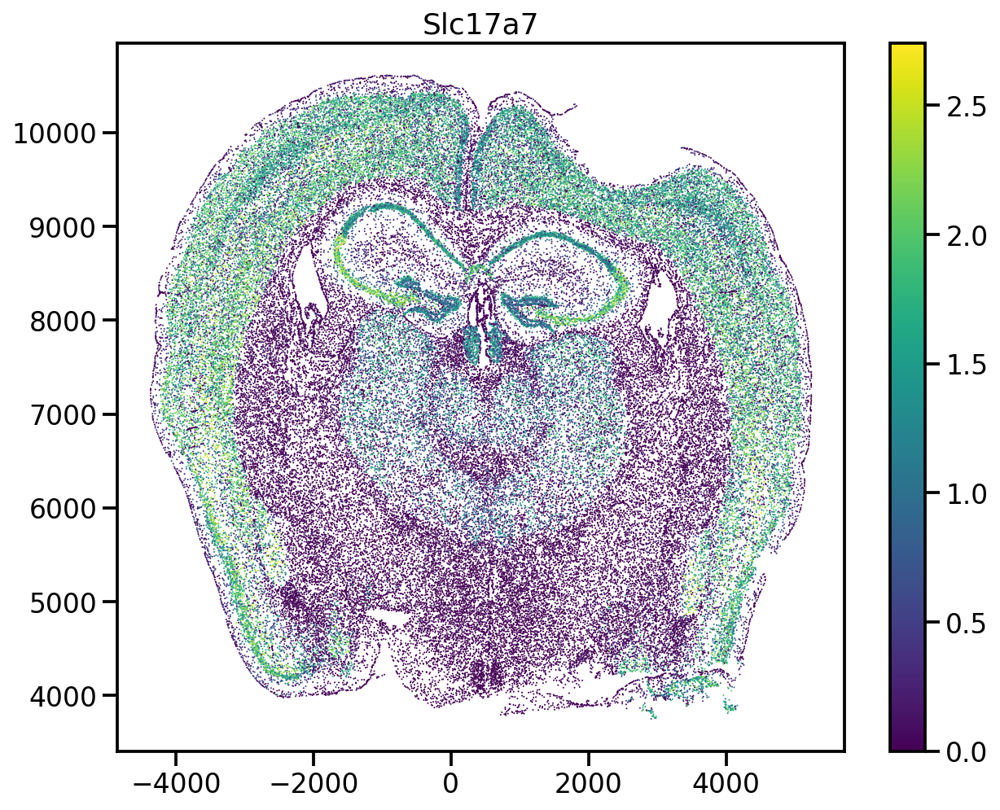

In [ ]:
theta = 40
xr, yr = rot2d(x, y, theta)

fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(xr, yr, c=np.log10(gexp+1), s=1, edgecolor='none')
ax.set_title(gene)
fig.colorbar(g)

### Iteration 10: Why the brain looks squashed? Fix this!
- spatial interval along different axes should be set equal.

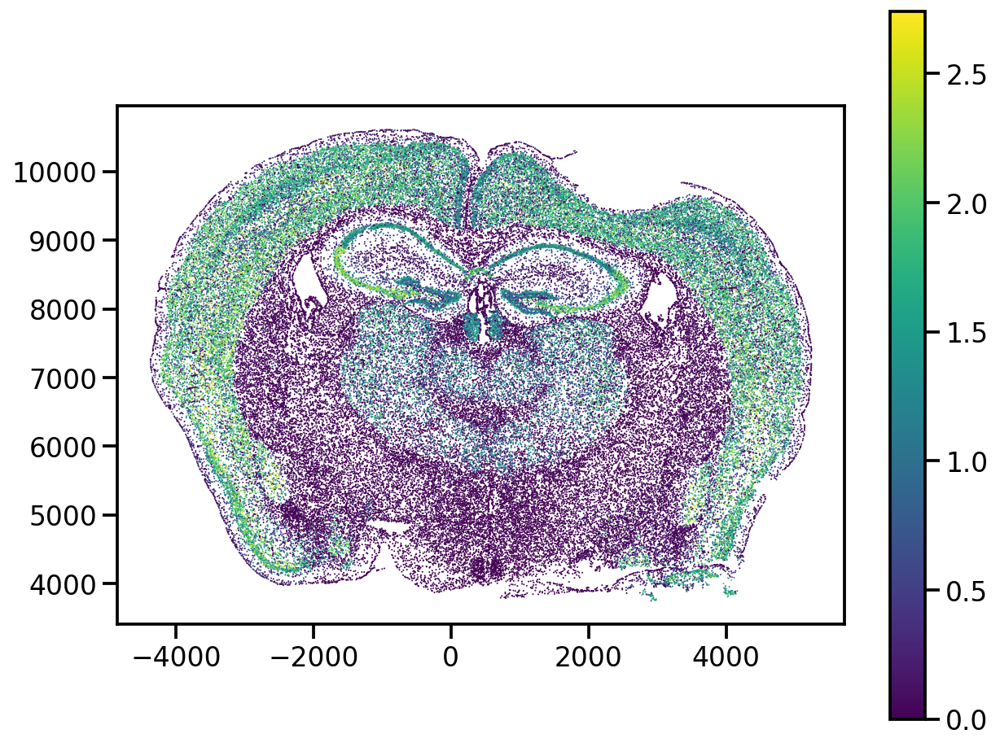

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(xr, yr, c=np.log10(gexp+1), s=1, edgecolor='none')
ax.set_aspect('equal')
fig.colorbar(g)

### Iteration 11: Final touch to make it more reader-friendly
- Add a title (gene name)
- Add a label to the color bar (numbers better comes with unit)
- Shrink the color bar (more efficient use of space and reader's attention)

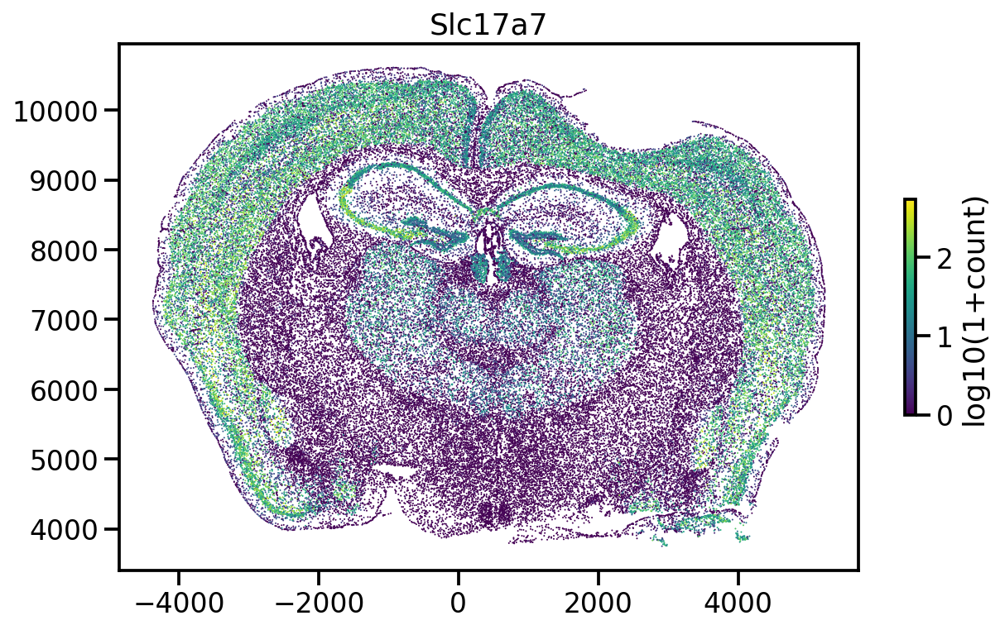

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
g = ax.scatter(xr, yr, c=np.log10(gexp+1), s=1, edgecolor='none')
ax.set_title(gene)
ax.set_aspect('equal')
fig.colorbar(g, label='log10(1+count)', shrink=0.3)